## Graph Discovery  
In our previous research, we have found that there is a strong signal between what we think of as coordinated ships vs uncoordinated ships when examining the correlations between random sets of 2 amongst both groups. Given this positive find, we considered a possible graph based approach to identifying anomalous coordinated groups. The idea is that amongst non-coordinated trajectories, the conditional dependence between tracks should only resemble chains, or isolated nodes. We should not find triangles or more complicated conditional dependent structures.  
Ideas:  
- We would expect to find tracks that are either conditionally dependent in chains, or not dependent at all  
- Ships should only really care about the ship in front of them and their movement is based on this  
- If a ship is conditionally dependent on more than one ship, or in a non-chain structure, it points to that ship coordinating its movements with multiple other ships  
  
A general approach to solving this problem might look something like the below pseduo code:  
1. Clean the data so that we have ship tracks which encompass a longiture, latitude, and time sample for a period of time  
2. Given this data, use a method such as PC to create a graph skeleton of the conditional independencies of the data  
3. Given a well filled out skeleton, we want to discover structures in the graph which are unusual. We expect this to be non-chain structures such as a pyramid. Use a graph discovery method to find these structures. The ships that are found in such strange structures are deemed anomalous or suspicious 


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as ticker
import random

from causallearn.search.ConstraintBased.PC import pc
from causallearn.utils.GraphUtils import GraphUtils


### PC Skeleton Discovery

In [2]:
full_la_data = pd.read_csv("../data/AIS_la_port.csv", low_memory=False)
full_ocean_data = pd.read_csv("../data/AIS_open_ocean.csv")

In [3]:
cols = ["MMSI", "BaseDateTime", "LAT", "LON", "SOG", "COG", "Heading", 'VesselType']
la_data = full_la_data[cols]
ocean_data = full_ocean_data[cols]

In [4]:
# Get only cargo ships
la_data = la_data.copy()[(la_data.VesselType >= 70) & (la_data.VesselType < 90)]
ocean_data = ocean_data.copy()[(ocean_data.VesselType >= 70) & (ocean_data.VesselType < 90)]

In [5]:
# Drop vessel type column
la_data.drop(columns=['VesselType'], axis=1, inplace=True)
ocean_data.drop(columns=['VesselType'], axis=1, inplace=True)

In [6]:
# Convert time string to timestamp
la_data['BaseDateTime'] = pd.to_datetime(la_data['BaseDateTime'], format='%Y-%m-%dT%H:%M:%S')
ocean_data['BaseDateTime'] = pd.to_datetime(ocean_data['BaseDateTime'], format='%Y-%m-%dT%H:%M:%S')

In [7]:
# Drop value in ocean data with only one record for a track
ocean_data = ocean_data[ocean_data.MMSI != 636013690]

In [8]:
# Remove entries where the ship is not moving
la_data = la_data[la_data.SOG != 0]
cargo_la = la_data.reset_index(drop=True)
cargo_la = cargo_la.drop(['LAT', 'LON', 'SOG', 'Heading'], axis=1)

ocean_data = ocean_data[ocean_data.SOG != 0]
cargo_ocean = ocean_data.reset_index(drop=True)
cargo_ocean.drop(['LAT', 'LON', 'SOG', 'Heading'], axis=1, inplace=True)

In [9]:
def get_single_ship_df(mmsi, data):
    return data[data['MMSI']==mmsi].sort_values(by='BaseDateTime')

### Notes on proceeding  
Several things to work on to create a graph of ships:  
1. Use only COG for now as the single variable to calculate associations
2. Bin the timestamps together for every 1, 2, 5, etc. minutes to get less Nans
3. We should not consider COG when the ship is not moving. The COG will vary a lot, but not reflect actual movement

After completing these three steps, rerun PC algorithm and visualize graph

In [10]:
data = cargo_la.copy()

#data['LAT_LON'] = list(zip(data['LAT'], data['LON']))
#data.drop(['LAT', 'LON', 'SOG', 'Heading'], axis=1, inplace=True)
data = data.set_index('BaseDateTime')
data = data.sort_index()
data.head(5)

,MMSI,COG
BaseDateTime,,
2020-01-01 00:00:00,366562000,69.6
2020-01-01 00:00:02,477287000,256.8
2020-01-01 00:00:36,309286000,111.0
2020-01-01 00:00:44,636013644,226.5
2020-01-01 00:00:48,311000111,150.0


In [11]:
tracks = data.pivot_table(values='COG', index=data.index, columns='MMSI', aggfunc='first')

In [12]:
tracks

MMSI,205700000,212348000,235060304,235076283,235554000,303294000,305034000,309046000,309286000,309955000,...,563025600,563033000,577364000,636010677,636013644,636015052,636015359,636017731,636018146,636092552
BaseDateTime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01 00:00:02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01 00:00:36,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,111.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-01 00:00:44,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,226.5,NaN,NaN,NaN,NaN,NaN
2020-01-01 00:00:48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-02 23:58:53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-01-02 23:58:59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,146.0
2020-01-02 23:59:25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# ERROR:  
I replaced all nan values with 0 and all other values with 1. This is incorrect!!! All non-nan values should remain as is

In [13]:
tracks = tracks.fillna(0)

In [14]:
tracks = tracks.resample("10T").mean()

In [15]:
tracks

MMSI,205700000,212348000,235060304,235076283,235554000,303294000,305034000,309046000,309286000,309955000,...,563025600,563033000,577364000,636010677,636013644,636015052,636015359,636017731,636018146,636092552
BaseDateTime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,0.000000,0.000000,0.000000,0.000000,26.065217,0.0,0.0,0.000000,2.413043,0.0,...,0.000000,0.000000,0.0,0.000000,20.002174,8.404348,0.000000,0.0,0.0,0.000000
2020-01-01 00:10:00,0.000000,0.000000,0.000000,0.000000,31.720930,0.0,0.0,6.146512,0.000000,0.0,...,0.000000,0.000000,0.0,0.000000,16.834884,13.937209,0.000000,0.0,0.0,14.906977
2020-01-01 00:20:00,0.000000,0.000000,0.000000,0.000000,23.485714,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.0,0.000000,17.488571,19.257143,0.000000,0.0,0.0,4.028571
2020-01-01 00:30:00,3.665116,0.000000,0.000000,0.000000,31.627907,0.0,0.0,0.000000,0.000000,0.0,...,0.000000,0.000000,0.0,0.000000,21.930233,19.306977,0.000000,0.0,0.0,18.534884
2020-01-01 00:40:00,0.000000,0.000000,0.000000,0.000000,26.675676,0.0,0.0,7.143243,0.000000,0.0,...,0.000000,2.159459,0.0,0.000000,17.978378,9.151351,0.000000,0.0,0.0,17.891892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-02 23:10:00,6.683607,3.737705,4.950820,1.021311,0.000000,0.0,0.0,9.134426,0.000000,0.0,...,0.000000,3.203279,0.0,1.727869,0.150820,12.277049,1.534426,0.0,0.0,2.049180
2020-01-02 23:20:00,7.044186,0.000000,8.116279,0.000000,0.000000,0.0,0.0,12.958140,0.000000,0.0,...,0.000000,7.725581,0.0,0.000000,0.000000,8.641860,2.220930,0.0,0.0,0.000000
2020-01-02 23:30:00,6.052000,1.580000,3.860000,0.000000,0.000000,0.0,0.0,5.572000,0.000000,0.0,...,0.000000,4.566000,0.0,0.000000,0.000000,16.806000,1.760000,0.0,0.0,0.000000


In [16]:
tracks.head()

MMSI,205700000,212348000,235060304,235076283,235554000,303294000,305034000,309046000,309286000,309955000,...,563025600,563033000,577364000,636010677,636013644,636015052,636015359,636017731,636018146,636092552
BaseDateTime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,0.000000,0.0,0.0,0.0,26.065217,0.0,0.0,0.000000,2.413043,0.0,...,0.0,0.000000,0.0,0.0,20.002174,8.404348,0.0,0.0,0.0,0.000000
2020-01-01 00:10:00,0.000000,0.0,0.0,0.0,31.720930,0.0,0.0,6.146512,0.000000,0.0,...,0.0,0.000000,0.0,0.0,16.834884,13.937209,0.0,0.0,0.0,14.906977
2020-01-01 00:20:00,0.000000,0.0,0.0,0.0,23.485714,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.000000,0.0,0.0,17.488571,19.257143,0.0,0.0,0.0,4.028571
2020-01-01 00:30:00,3.665116,0.0,0.0,0.0,31.627907,0.0,0.0,0.000000,0.000000,0.0,...,0.0,0.000000,0.0,0.0,21.930233,19.306977,0.0,0.0,0.0,18.534884
2020-01-01 00:40:00,0.000000,0.0,0.0,0.0,26.675676,0.0,0.0,7.143243,0.000000,0.0,...,0.0,2.159459,0.0,0.0,17.978378,9.151351,0.0,0.0,0.0,17.891892


Now we can try running PC 

In [17]:
graph = pc(tracks.values)

  0%|          | 0/57 [00:00<?, ?it/s]

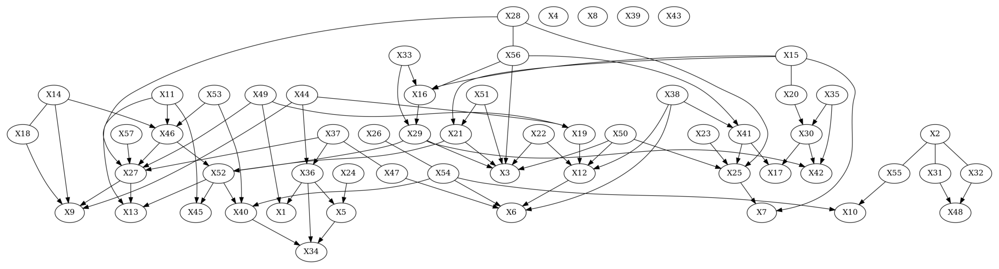

In [18]:
graph.draw_pydot_graph()

Let's create the same graph, but for the open ocean data

In [19]:
data_ocean = cargo_ocean.copy()
data_ocean = data_ocean.set_index('BaseDateTime')
data_ocean = data_ocean.sort_index()

In [20]:

tracks_ocean = data_ocean.pivot_table(values='COG', index=data_ocean.index, columns='MMSI', aggfunc='first')
tracks_ocean = tracks_ocean.fillna(0)
tracks_ocean = tracks_ocean.resample("10T").mean()


  0%|          | 0/33 [00:00<?, ?it/s]

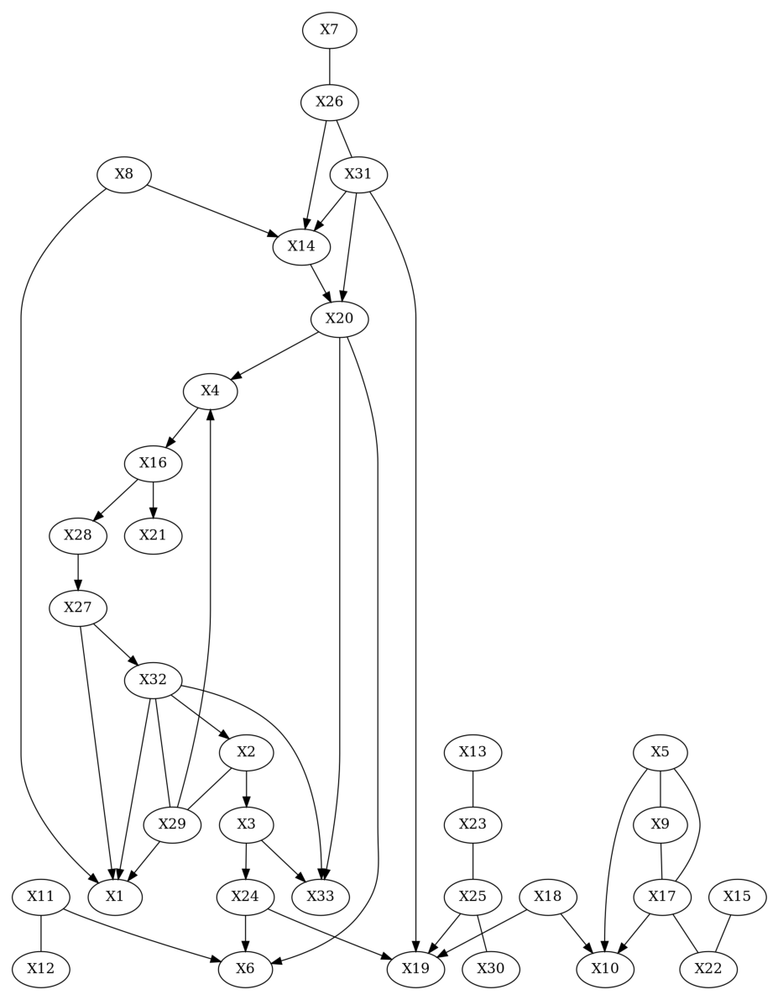

In [21]:
graph_ocean = pc(tracks_ocean.values)
graph_ocean.draw_pydot_graph()

### Graphs from smaller time window for data around LA

In [22]:
start_time = tracks.index[30]
end_time = tracks.index[54]

In [23]:
start_time

Timestamp('2020-01-01 05:00:00')

In [24]:
mask = (tracks.index > start_time) & (tracks.index < end_time)

In [25]:
morning_tracks_la = tracks[mask]

In [26]:
# remove tracks with all constants
nunique = morning_tracks_la.nunique()
constant_cols = nunique[nunique == 1].index
morning_tracks_la = morning_tracks_la.drop(constant_cols, axis=1)

In [27]:
morning_tracks_la.shape

(23, 24)

  0%|          | 0/24 [00:00<?, ?it/s]

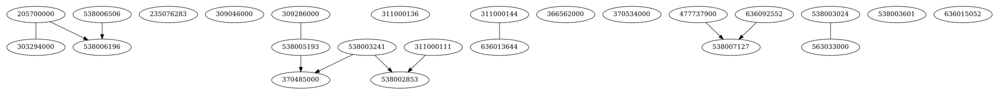

In [28]:
graph_la = pc(morning_tracks_la.values)
cols = list(morning_tracks_la.columns.values)
graph_la.draw_pydot_graph(labels=cols)

## TODO  
We now have smaller graphs showing the associations between ship tracks. How can we verify that these graphs are useful? Does a triangular pattern point to strange coordination? Does a chain refer to a line of ships?  
1. Find a way to visualize the tracks of each ship so we can see what the graph is referring to 

We need to convert a KML file from google earth to shapfile

In [29]:
import descartes
import geopandas as gpd
import fiona
from shapely.geometry import Point, LineString, Polygon

%matplotlib inline

In [30]:
def draw_tracks(data, mmsi_list):
    data = data[data.MMSI.isin(mmsi_list)]
    points = [Point(x, y) for x, y in zip(data.LON, data.LAT)]
    points_df = gpd.GeoDataFrame(data, geometry=points, crs ="EPSG:4326")

    # treat each `ID` group of points as a line
    lines = points_df.groupby(['MMSI'])['geometry'].apply(lambda x:  LineString(x.tolist()))
    
    # store as a GeodataFrame and add 'ID' as a column (currently stored as the 'index')
    lines = gpd.GeoDataFrame(lines, geometry='geometry', crs="EPSG:4326") 
    lines.reset_index(inplace=True)
    lines.plot(column='MMSI', categorical=True, legend=True)

def draw_all_tracks(data):
    all_ships = list(data.columns.values)
    draw_tracks(data, all_ships)

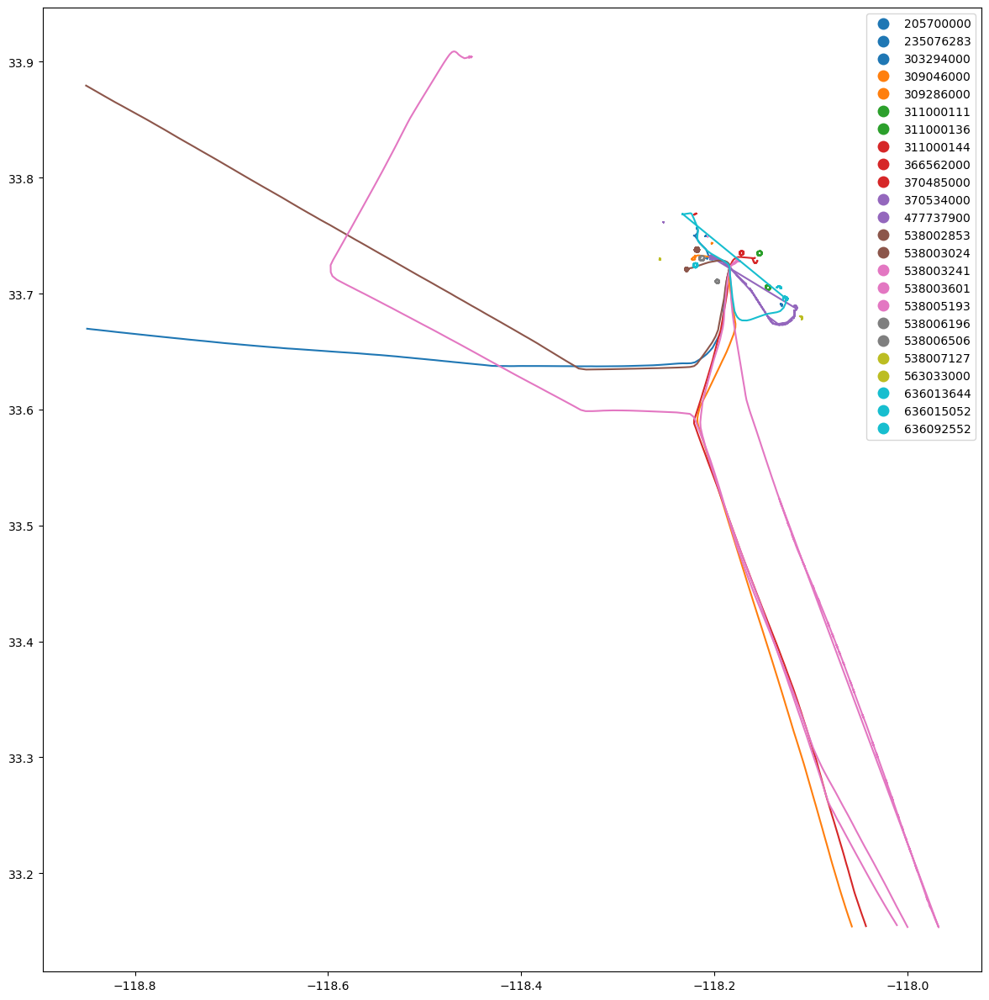

In [31]:
# All tracks shown
all_ships = list(morning_tracks_la.columns.values)
draw_tracks(la_data, all_ships)

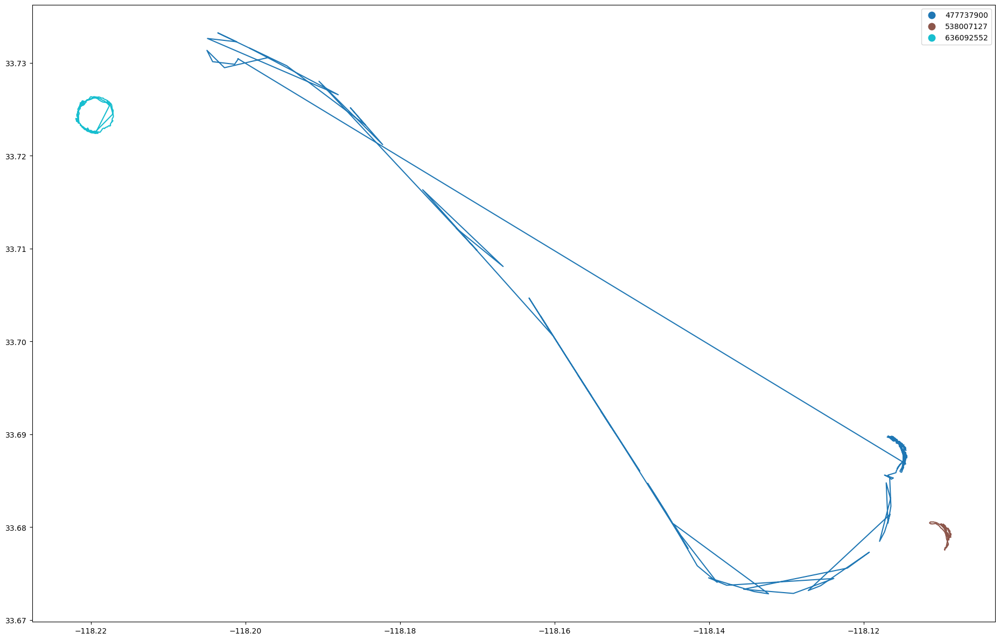

In [32]:
mmsi_list_1 = [477737900, 538007127, 636092552]
draw_tracks(la_data, mmsi_list_1)

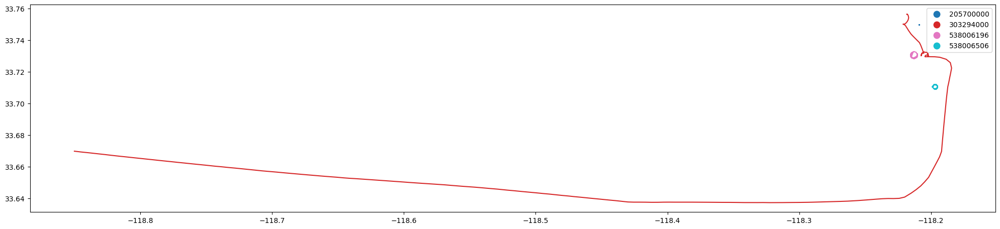

In [33]:
mmsi_list_2 = [303294000, 205700000, 538006196, 538006506]
draw_tracks(la_data, mmsi_list_2)

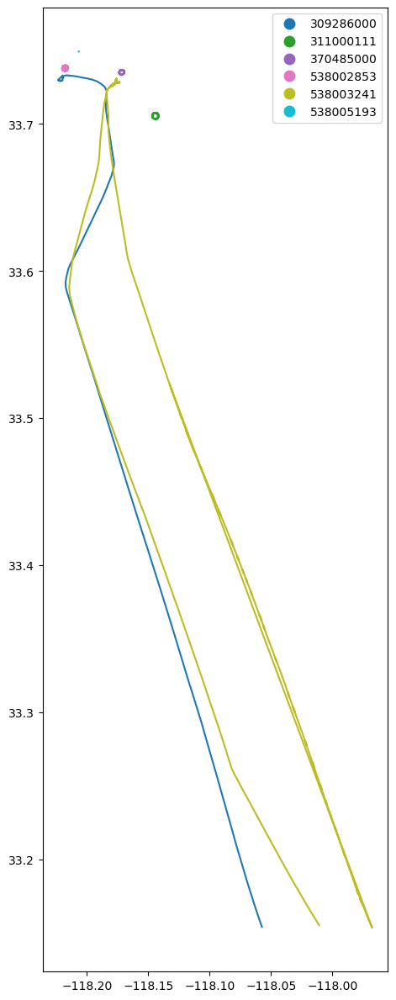

In [34]:
mmsi_list_3 = [309286000, 538005193, 370485000, 538003241, 538002853, 311000111]
draw_tracks(la_data, mmsi_list_3)

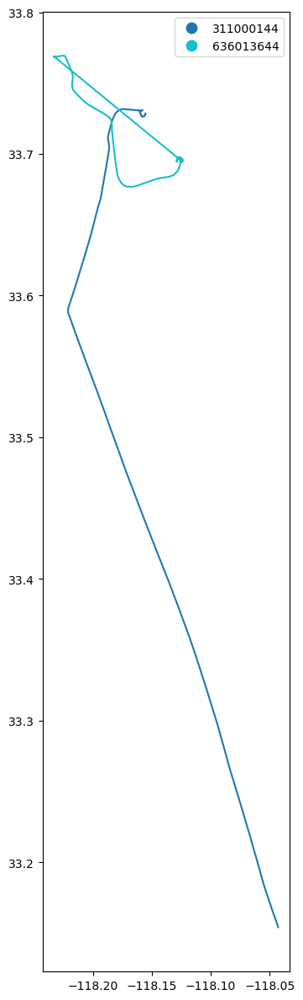

In [35]:
mmsi_list_4 = [311000144, 636013644]
draw_tracks(la_data, mmsi_list_4)

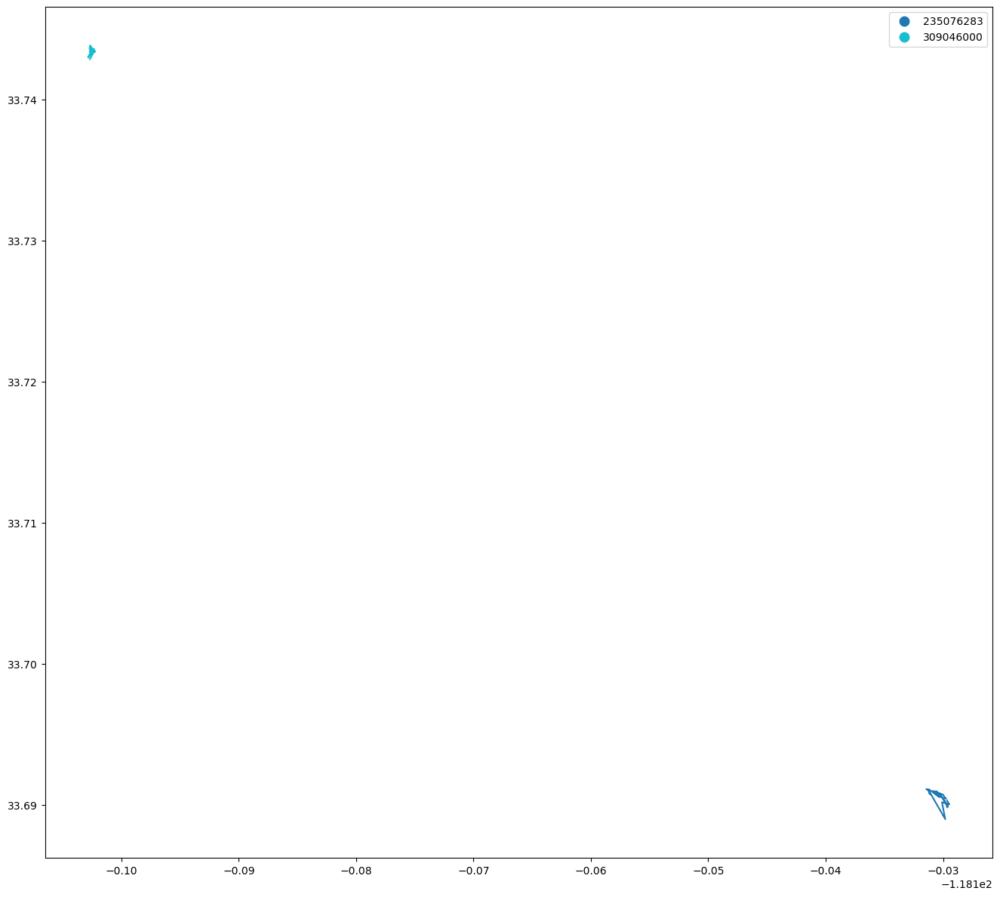

In [36]:
mmsi_list_5 = [235076283, 309046000]
draw_tracks(la_data, mmsi_list_5)

## Analysis on open ocean data  
Let's perform the same graph discovery and track analysis using the data from the morning in the open ocean

In [37]:
mask = (tracks_ocean.index > start_time) & (tracks_ocean.index < end_time)
morning_tracks_ocean = tracks_ocean[mask]
# remove tracks with all constants
nunique = morning_tracks_ocean.nunique()
constant_cols = nunique[nunique == 1].index
morning_tracks_ocean = morning_tracks_ocean.drop(constant_cols, axis=1)

  0%|          | 0/13 [00:00<?, ?it/s]

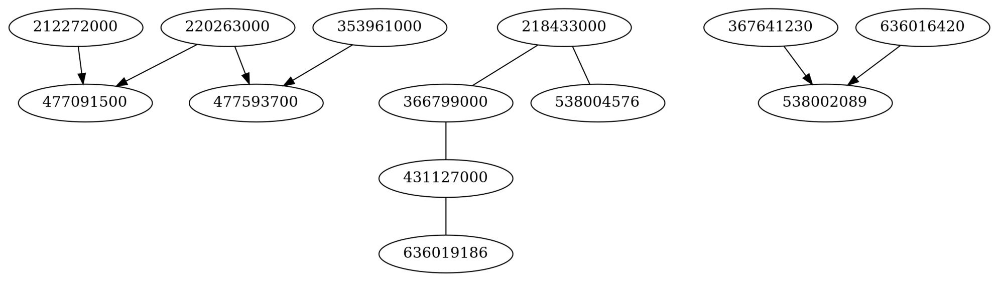

In [38]:
graph_ocean = pc(morning_tracks_ocean.values)
cols = list(morning_tracks_ocean.columns.values)
graph_ocean.draw_pydot_graph(labels=cols)

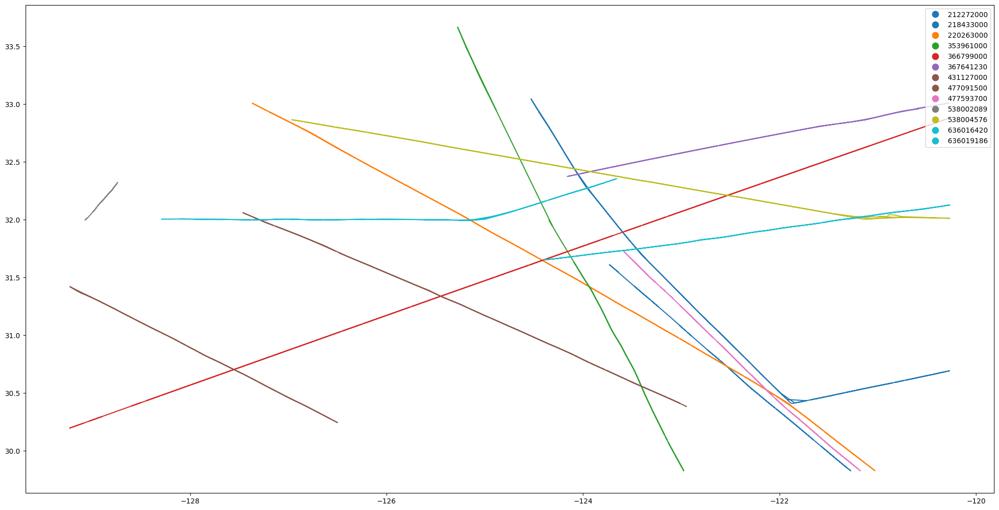

In [39]:
# All tracks shown
all_ships = list(morning_tracks_ocean.columns.values)
draw_tracks(ocean_data, all_ships)

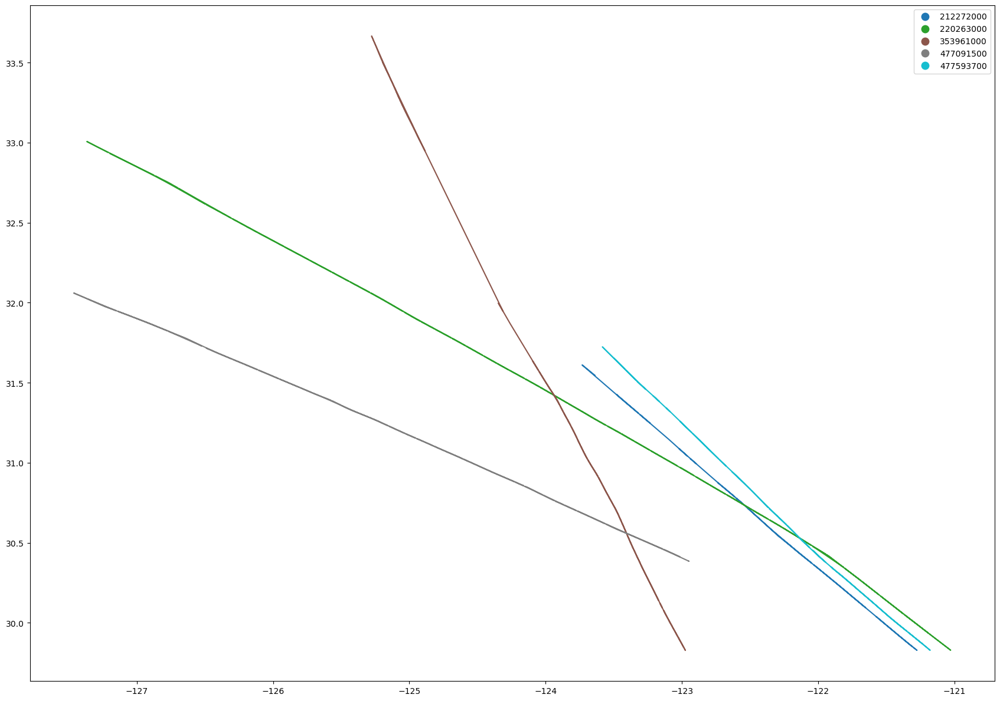

In [40]:
mmsi_list_2 = [212272000, 477091500, 220263000, 477593700, 353961000]
draw_tracks(ocean_data, mmsi_list_2)

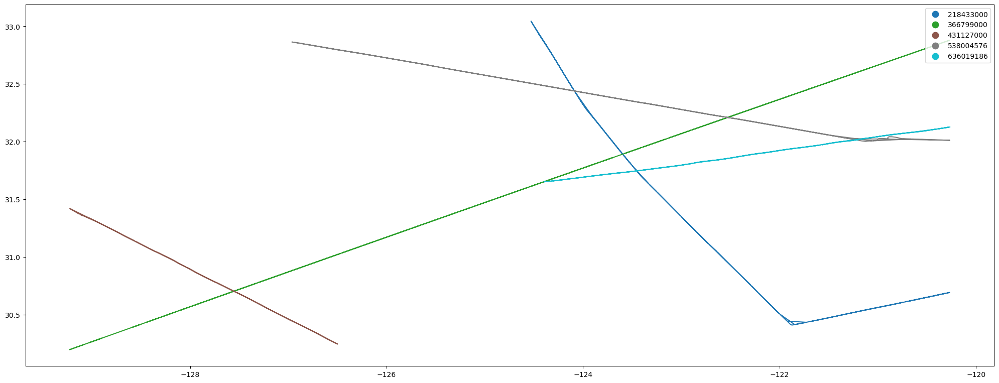

In [41]:
mmsi_list_1 = [218433000, 366799000, 538004576, 431127000, 636019186]
draw_tracks(ocean_data, mmsi_list_1)

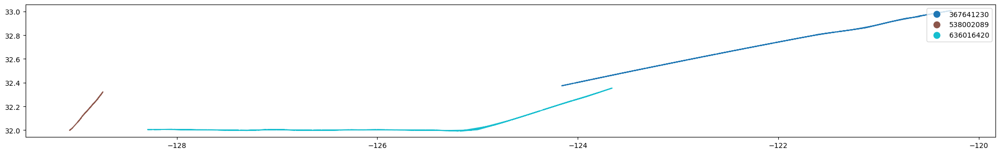

In [42]:
mmsi_list_1 = [367641230, 538002089, 636016420]
draw_tracks(ocean_data, mmsi_list_1)

## Creating a correlated group  
We want to test if the graph discovery can actually pick up on a group that should be correlated or connected. Here, we will take some tracks that are very similar and alter there times so they move in the same direction at the same time. We should see them connected in the graph then. 

### Idea  
Take one track and duplicate it with a very small amount of noise added to the LON, LAT, and COG so that the correlation between this track and the original are very close. Do this for 3 ships and add them into the la_data dataset. Then recreate the graph and see if these 3 ships form a structure.

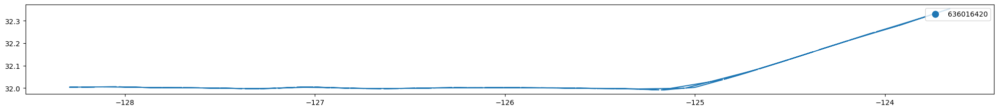

In [43]:
draw_tracks(ocean_data, [636016420])

In [44]:
ship_1 = ocean_data[ocean_data.MMSI == 636016420]

In [45]:
ship_1

,MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading
2816,636016420,2020-01-01 00:30:32,32.31985,-123.78031,12.8,250.5,255.0
2817,636016420,2020-01-01 00:28:32,32.32219,-123.77211,13.1,249.7,255.0
2818,636016420,2020-01-01 00:26:33,32.32458,-123.76399,13.3,253.8,256.0
2819,636016420,2020-01-01 00:24:12,32.32732,-123.75444,13.0,251.0,256.0
2820,636016420,2020-01-01 00:22:33,32.32914,-123.74766,13.1,253.3,257.0
...,...,...,...,...,...,...,...
3494,636016420,2020-01-01 17:15:05,32.00497,-128.17292,13.7,268.8,269.0
3495,636016420,2020-01-01 17:13:16,32.00502,-128.16477,13.8,270.0,271.0
3496,636016420,2020-01-01 17:12:04,32.00501,-128.15929,13.9,269.2,270.0
3497,636016420,2020-01-01 17:41:14,32.00425,-128.29125,13.5,268.6,269.0


In [46]:
ship_2 = ship_1.copy()
ship_3 = ship_1.copy()

In [47]:
ship_2.MMSI = np.full(683, 1)
ship_3.MMSI = np.full(683, 2)

In [48]:
# add a small amount of noise to lat, lon, and cog
ship_2.LAT = ship_2.LAT + np.random.normal(0, .01, 683)
ship_2.LON = ship_2.LON + np.random.normal(0, .01, 683)
ship_2.COG = ship_2.COG + np.random.uniform(-.3, .3, 683)

ship_3.LAT = ship_3.LAT + np.random.normal(0, .01, 683)
ship_3.LON = ship_3.LON + np.random.normal(0, .01, 683)
ship_3.COG = ship_3.COG + np.random.uniform(-.5, .5, 683)

In [49]:
ship_2.reset_index(drop=True, inplace=True)
ship_3.reset_index(drop=True, inplace=True)

In [50]:
revised_ocean_data = pd.concat([ocean_data, ship_2, ship_3], ignore_index=True)

In [51]:
revised_cargo_ocean = revised_ocean_data.reset_index(drop=True)
revised_cargo_ocean.drop(['LAT', 'LON', 'SOG', 'Heading'], axis=1, inplace=True)

In [52]:
revised_data_ocean = revised_cargo_ocean.copy()
revised_data_ocean = revised_data_ocean.set_index('BaseDateTime')
revised_data_ocean = revised_data_ocean.sort_index()

In [53]:
revised_tracks_ocean = revised_data_ocean.pivot_table(values='COG', index=revised_data_ocean.index, columns='MMSI', aggfunc='first')

In [54]:
revised_tracks_ocean = revised_tracks_ocean.fillna(0)

In [55]:
revised_tracks_ocean = revised_tracks_ocean.resample("10T").mean()

In [56]:
mask = (revised_tracks_ocean.index > start_time) & (revised_tracks_ocean.index < end_time)
revised_morning_tracks_ocean = revised_tracks_ocean[mask]
# remove tracks with all constants
nunique = revised_morning_tracks_ocean.nunique()
constant_cols = nunique[nunique == 1].index
revised_morning_tracks_ocean = revised_morning_tracks_ocean.drop(constant_cols, axis=1)

  0%|          | 0/15 [00:00<?, ?it/s]

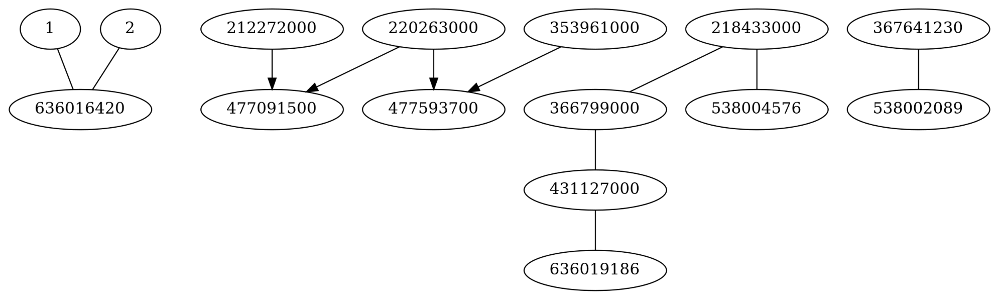

In [57]:
graph_ocean = pc(revised_morning_tracks_ocean.values)
cols = list(revised_morning_tracks_ocean.columns.values)
graph_ocean.draw_pydot_graph(labels=cols)

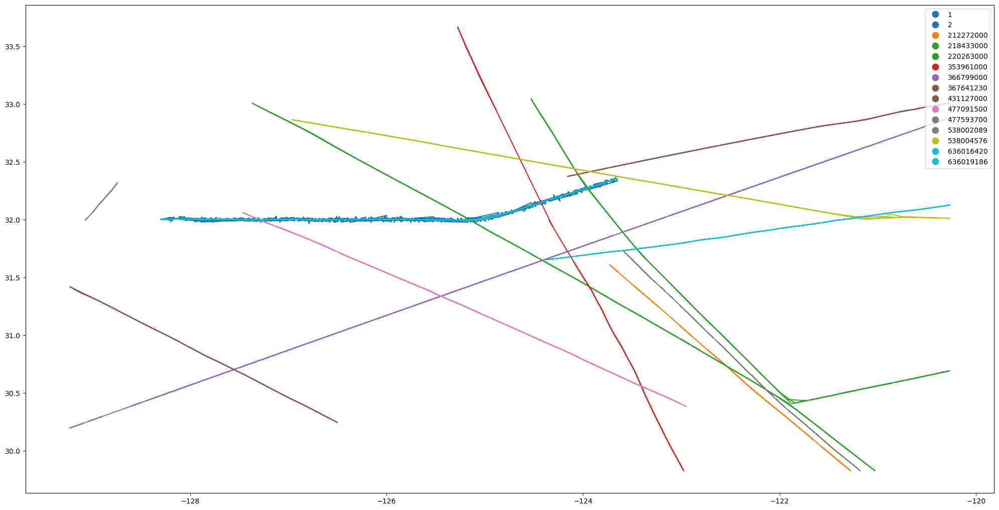

In [58]:
all_ships = list(revised_morning_tracks_ocean.columns.values)
draw_tracks(revised_ocean_data, all_ships)

## Time Shift Analysis  
We want to see what the graph representation would look like if a route was time shifted slightly. At what level of time difference would the route no longer be correlated with the original?  
- Select a track
- Copy the track
- Time shift the track by moving all timestamps ahead 5 minutes
- Discover the graph with new time shifted route
- Repeat for several tracks

One issue that may be affecting the graph contstruction is that the tracks are not cleaned properly to form just a single track. Some tracks overlap and contain different tracks within them.

In [59]:
# Data cleaning and processing functions
def clean_data_processor(data):
    clean_data = data.reset_index(drop=True)
    clean_data.drop(['LAT', 'LON', 'SOG', 'Heading'], axis=1, inplace=True)
    clean_data = clean_data.copy()
    clean_data = clean_data.set_index('BaseDateTime')
    clean_data = clean_data.sort_index()
    return clean_data

def get_tracks(data, time_interval="10T"):
    tracks_data = data.pivot_table(values='COG', index=data.index, columns='MMSI', aggfunc='first')
    tracks_data = tracks_data.fillna(0)
    tracks_data = tracks_data.resample(time_interval).mean()
    return tracks_data

def get_sub_tracks(tracks_data, start_time, end_time):
    mask = (tracks_data.index > start_time) & (tracks_data.index < end_time)
    sub_tracks_data = tracks_data[mask]
    # remove tracks with all constants
    nunique = sub_tracks_data.nunique()
    constant_cols = nunique[nunique == 1].index
    sub_tracks_data = sub_tracks_data.drop(constant_cols, axis=1)
    return sub_tracks_data

def time_shift_track(shift_delta, mmsi, new_mmsi, data):
    ship = data[data.MMSI == mmsi]
    time_shift_ship = ship.copy()
    time_shift_ship.MMSI = np.full(ship.shape[0], new_mmsi)
    time_shift_ship.BaseDateTime = time_shift_ship.BaseDateTime + pd.Timedelta(minutes=shift_delta)
    time_shift_ship.reset_index(drop=True, inplace=True)
    return pd.concat([time_shift_ship, data], ignore_index=True)

def get_pc_graph(tracks_data):
    graph_ocean = pc(tracks_data.values)
    cols = list(tracks_data.columns.values)
    graph_ocean.draw_pydot_graph(labels=cols)

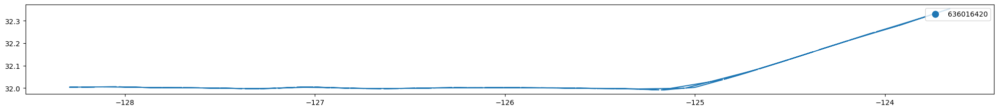

In [60]:
draw_tracks(ocean_data, [636016420])

In [61]:
time_shift_ocean_data = time_shift_track(5, 636016420, 1, ocean_data)
time_shift_ocean_data = time_shift_track(10, 636016420, 2, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(30, 636016420, 3, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(60, 636016420, 4, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(120, 636016420, 5, time_shift_ocean_data)

In [62]:
clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)

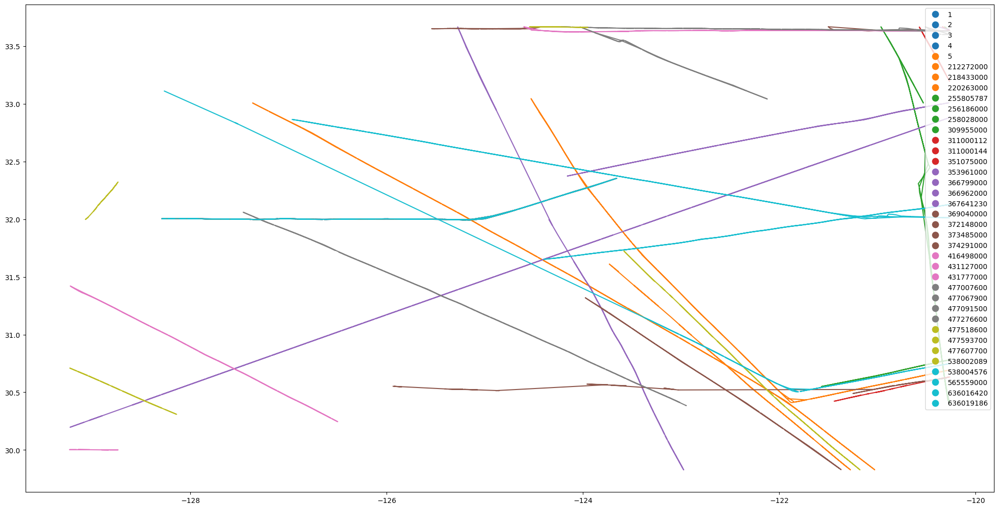

In [63]:
mmsi_list = list(tracks_data.columns.values)
draw_tracks(time_shift_ocean_data, mmsi_list)

  0%|          | 0/38 [00:00<?, ?it/s]

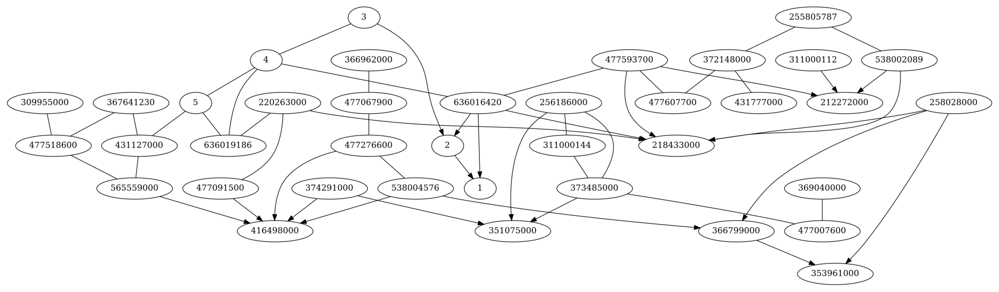

In [64]:
# Full ocean data shown
get_pc_graph(tracks_data)

Above, we see that after a 30 minute time shift, a track becomes not directly dependent with itself. Below, we examine this closer focusing only on morning data

In [65]:
start_time, end_time

(Timestamp('2020-01-01 05:00:00'), Timestamp('2020-01-01 09:00:00'))

In [66]:
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

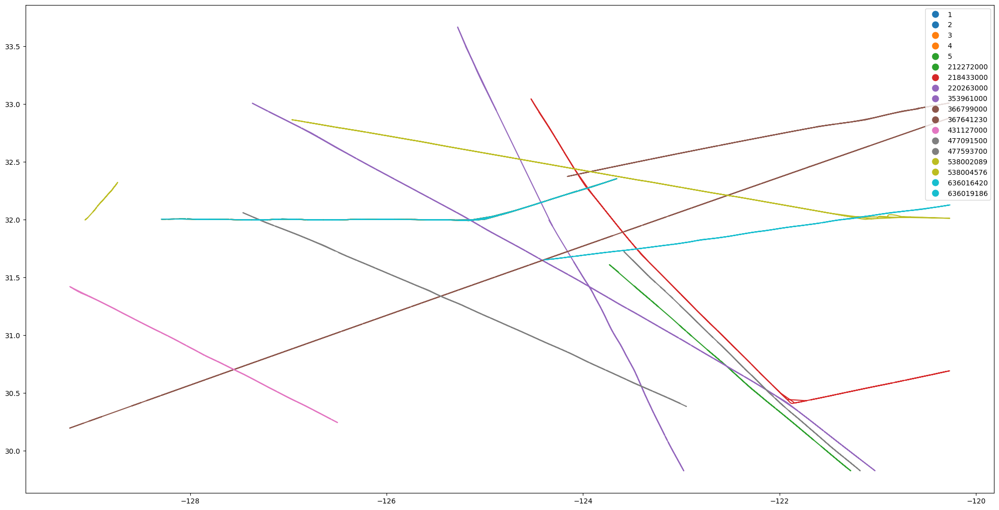

In [67]:
mmsi_list = list(morning_tracks.columns.values)
draw_tracks(time_shift_ocean_data, mmsi_list)


  0%|          | 0/18 [00:00<?, ?it/s]

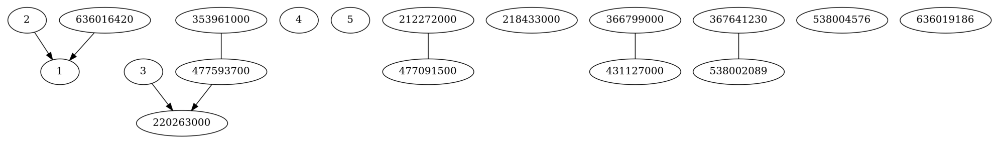

In [68]:
get_pc_graph(morning_tracks)

**Let us add further granularity for the time shift**

In [69]:
time_shift_ocean_data = time_shift_track(5, 636016420, 1, ocean_data)
time_shift_ocean_data = time_shift_track(10, 636016420, 2, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(15, 636016420, 3, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(20, 636016420, 4, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(25, 636016420, 5, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(30, 636016420, 6, time_shift_ocean_data)

In [70]:
clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

  0%|          | 0/19 [00:00<?, ?it/s]

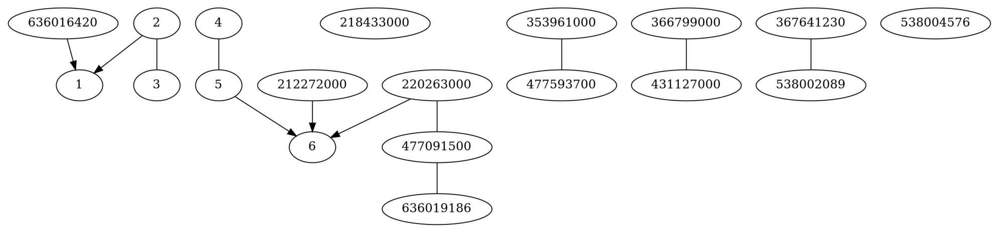

In [71]:
get_pc_graph(morning_tracks)

## Time Shift Analysis Part 2  
Above, we selected a single track and reproduced 5 different time shifts of the same track. We see in the above graph that after 30 minute time shifts, the tracks are no longer correlated or connected in the graph. Below, we will repeat the analysis with other ships in the open ocean dataset to verify this is reproducible.

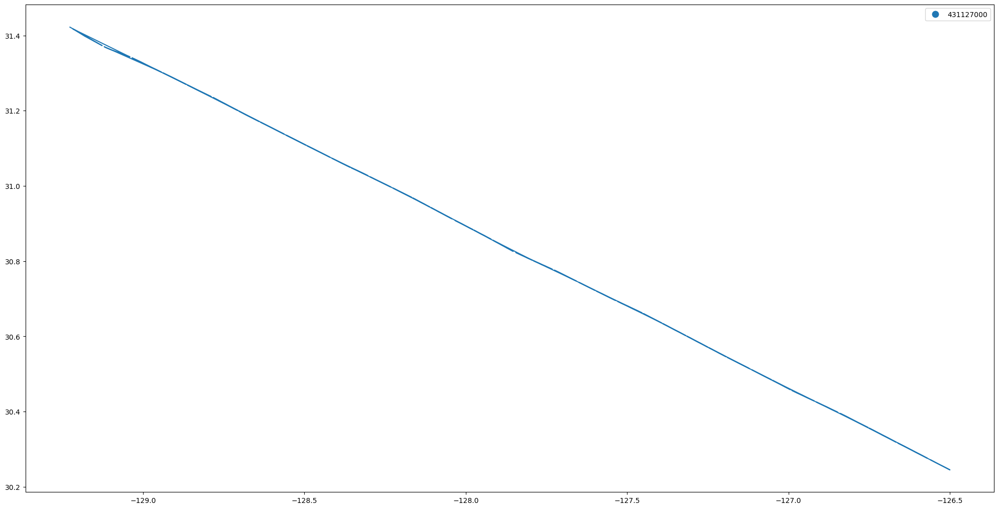

In [72]:
draw_tracks(ocean_data, [431127000])

In [73]:
time_shift_ocean_data = time_shift_track(5, 431127000, 6, ocean_data)
time_shift_ocean_data = time_shift_track(10, 431127000, 7, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(15, 431127000, 8, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(20, 431127000, 9, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(25, 431127000, 10, time_shift_ocean_data)

In [74]:
clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)

In [75]:
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

  0%|          | 0/18 [00:00<?, ?it/s]

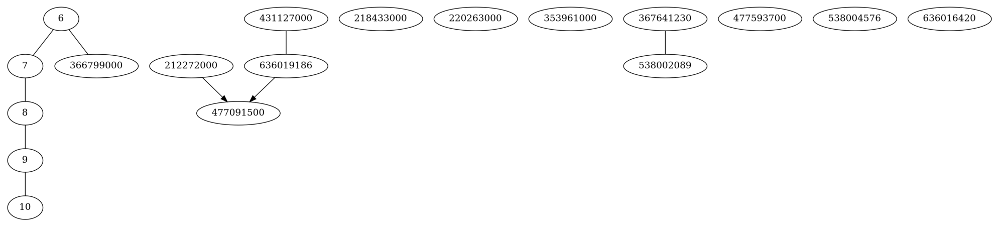

In [76]:
get_pc_graph(morning_tracks)

**Repeat with greater granularity**

In [77]:
time_shift_ocean_data = time_shift_track(5, 431127000, 1, ocean_data)
time_shift_ocean_data = time_shift_track(10, 431127000, 2, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(15, 431127000, 3, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(20, 431127000, 4, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(25, 431127000, 5, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(30, 431127000, 6, time_shift_ocean_data)

clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

  0%|          | 0/19 [00:00<?, ?it/s]

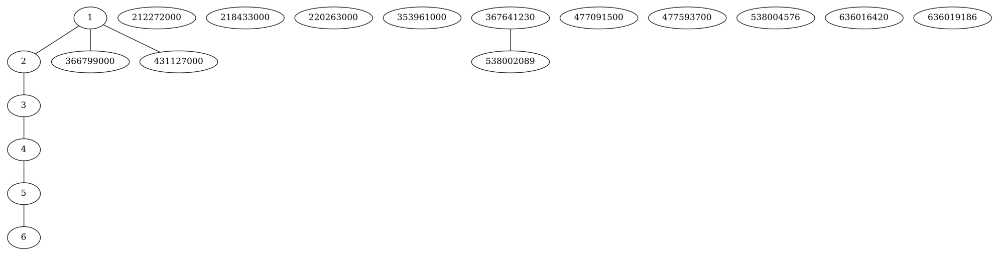

In [78]:
get_pc_graph(morning_tracks)

**Trying a different track**

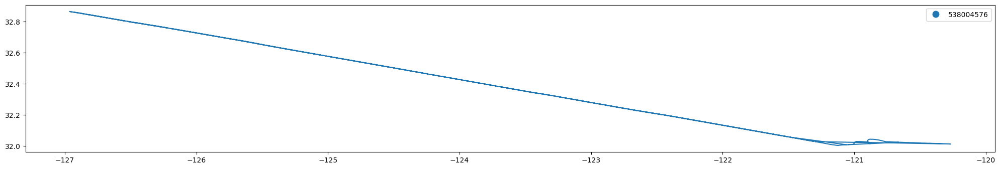

In [79]:
mmsi = 538004576
draw_tracks(ocean_data, [mmsi])

  0%|          | 0/18 [00:00<?, ?it/s]

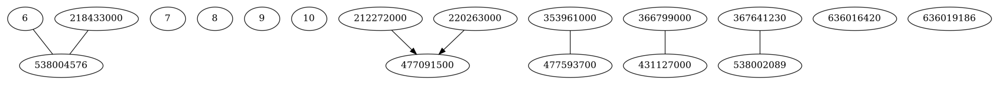

In [80]:
time_shift_ocean_data = time_shift_track(5, mmsi, 6, ocean_data)
time_shift_ocean_data = time_shift_track(10, mmsi, 7, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(30, mmsi, 8, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(60, mmsi, 9, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(120, mmsi, 10, time_shift_ocean_data)

clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

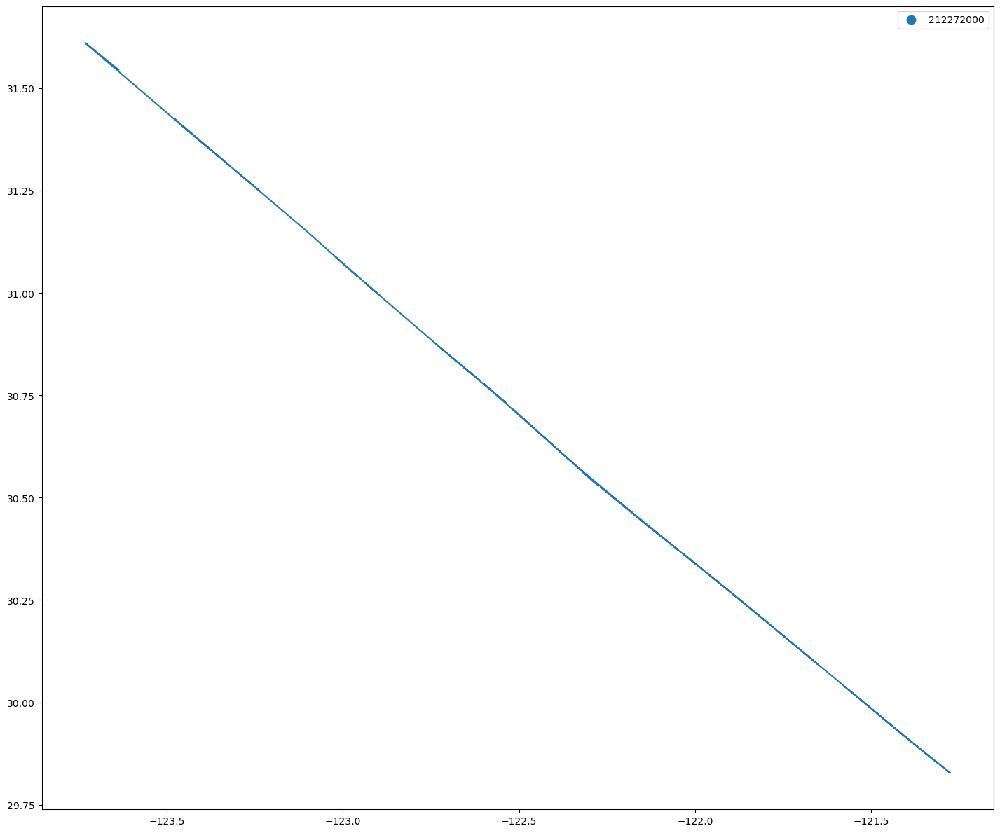

In [81]:
mmsi = 212272000
draw_tracks(ocean_data, [mmsi])

  0%|          | 0/18 [00:00<?, ?it/s]

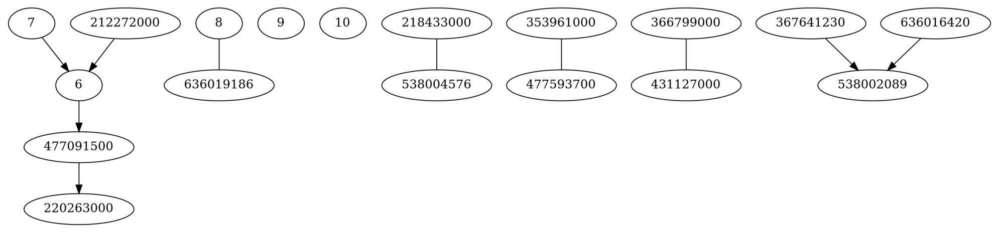

In [82]:
time_shift_ocean_data = time_shift_track(5, mmsi, 6, ocean_data)
time_shift_ocean_data = time_shift_track(10, mmsi, 7, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(30, mmsi, 8, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(60, mmsi, 9, time_shift_ocean_data)
time_shift_ocean_data = time_shift_track(120, mmsi, 10, time_shift_ocean_data)

clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

## Time Shift Analysis Part 3  
Previously, we have solely examined the ships that are further out into the open ocean. Does the dependence structures look different when examining ships close to a port?

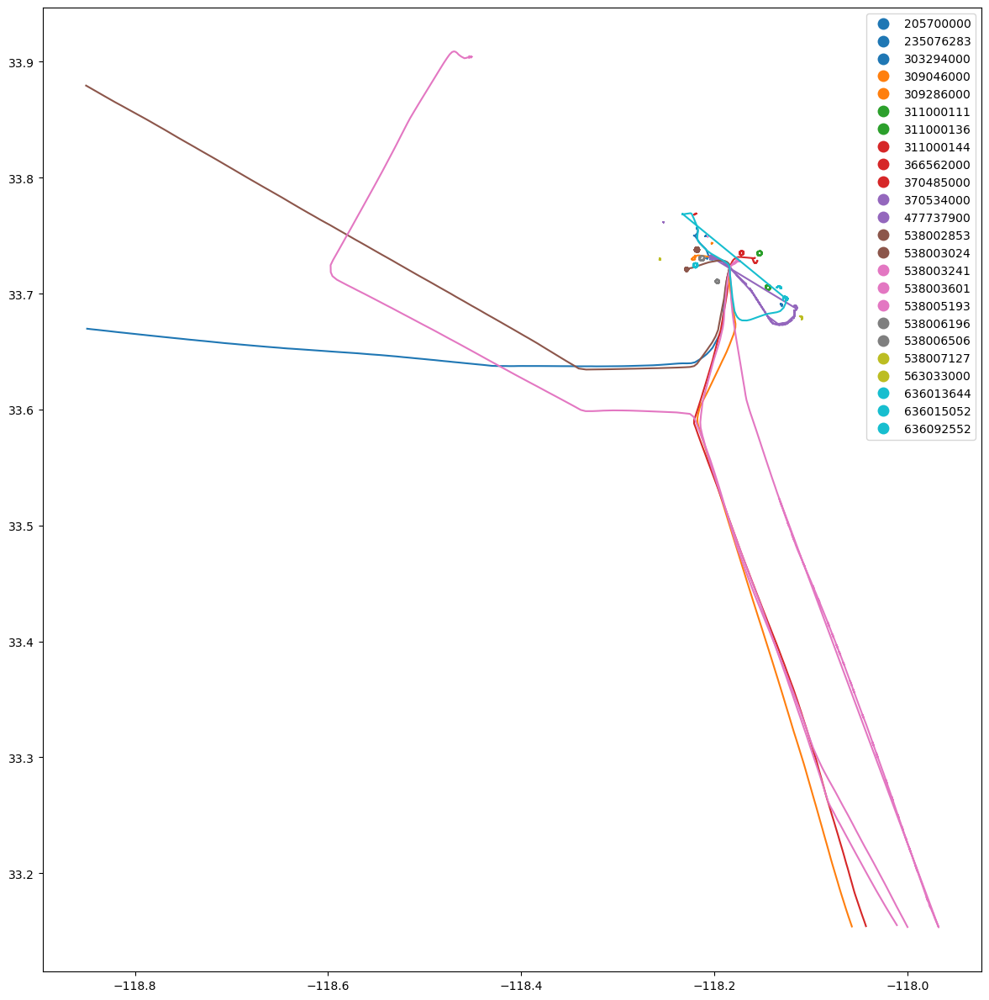

In [83]:
mmsi_list = list(morning_tracks_la.columns.values)
draw_tracks(la_data, mmsi_list)

**Sample 1**

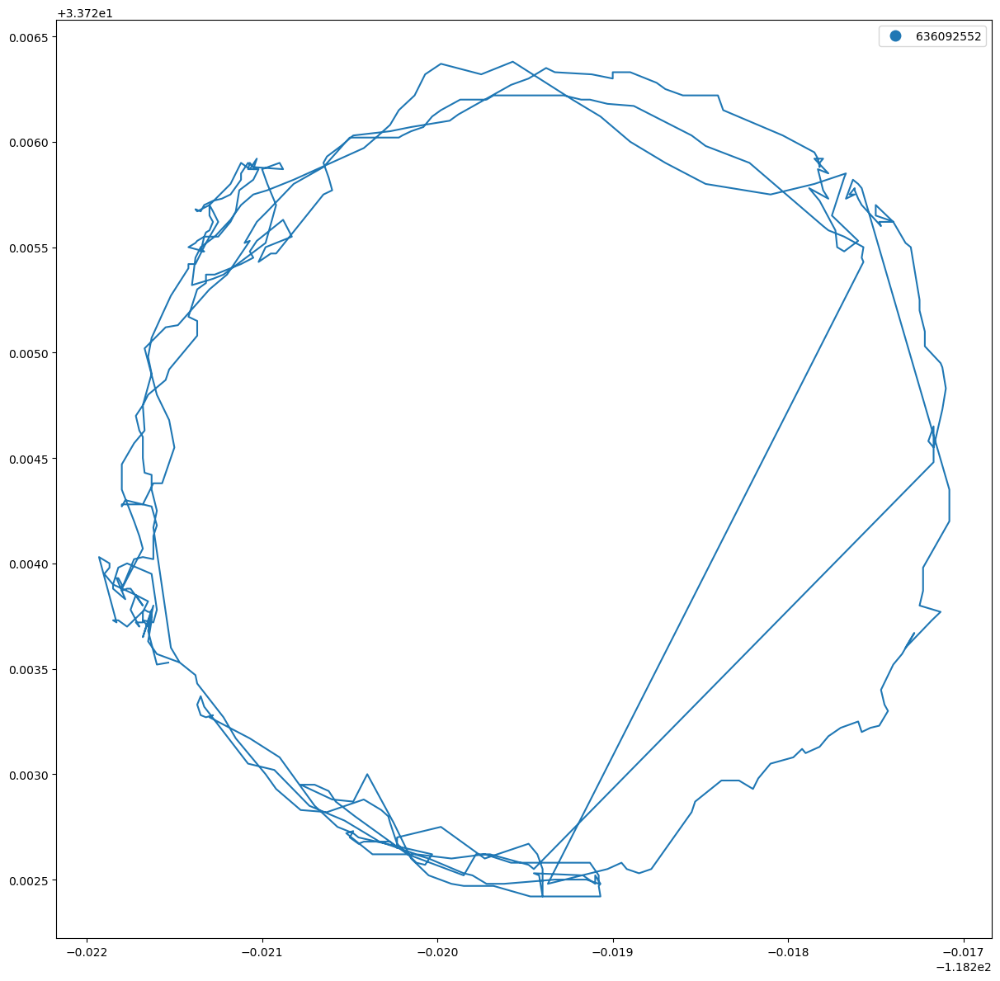

In [84]:
mmsi = 636092552
draw_tracks(la_data, [mmsi])

  0%|          | 0/29 [00:00<?, ?it/s]

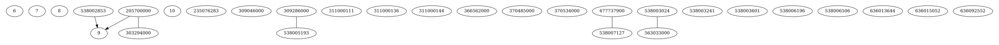

In [85]:
time_shift_la_data = time_shift_track(5, mmsi, 6, la_data)
time_shift_la_data = time_shift_track(10, mmsi, 7, time_shift_la_data)
time_shift_la_data = time_shift_track(30, mmsi, 8, time_shift_la_data)
time_shift_la_data = time_shift_track(60, mmsi, 9, time_shift_la_data)
time_shift_la_data = time_shift_track(120, mmsi, 10, time_shift_la_data)

clean_data = clean_data_processor(time_shift_la_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

**Sample 2**

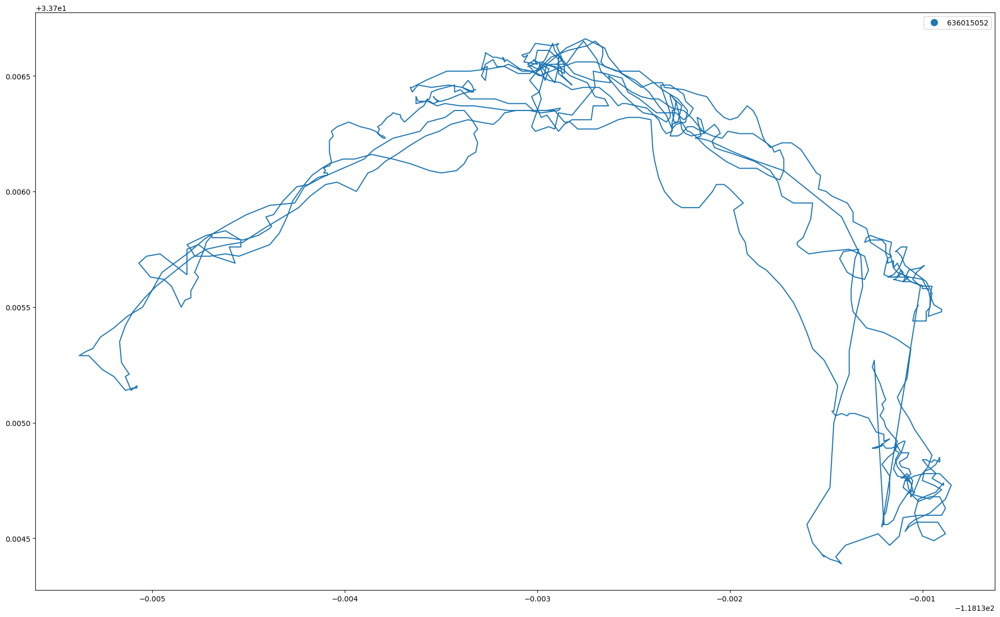

In [86]:
mmsi = 636015052
draw_tracks(la_data, [mmsi])

  0%|          | 0/29 [00:00<?, ?it/s]

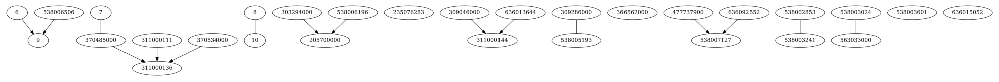

In [87]:
time_shift_la_data = time_shift_track(5, mmsi, 6, la_data)
time_shift_la_data = time_shift_track(10, mmsi, 7, time_shift_la_data)
time_shift_la_data = time_shift_track(30, mmsi, 8, time_shift_la_data)
time_shift_la_data = time_shift_track(60, mmsi, 9, time_shift_la_data)
time_shift_la_data = time_shift_track(120, mmsi, 10, time_shift_la_data)

clean_data = clean_data_processor(time_shift_la_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

**Sample 3**

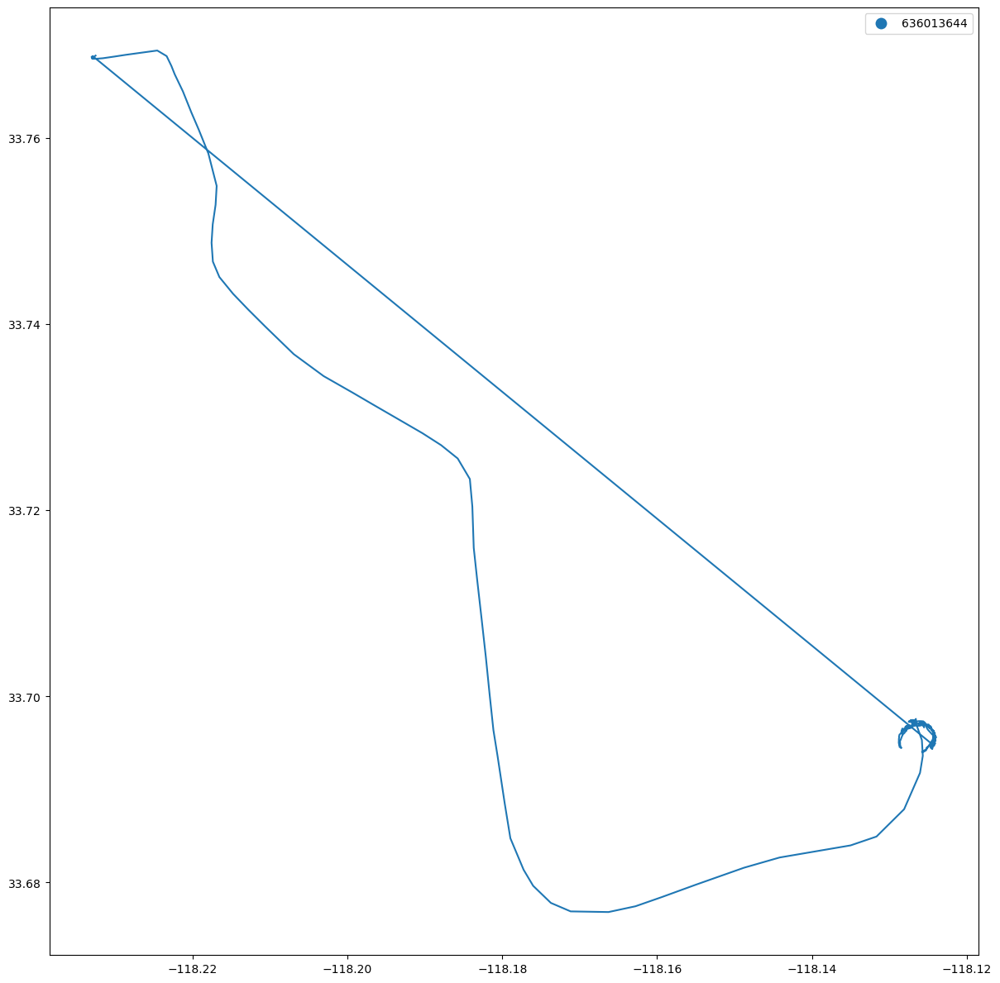

In [88]:
mmsi = 636013644
draw_tracks(la_data, [mmsi])

  0%|          | 0/29 [00:00<?, ?it/s]

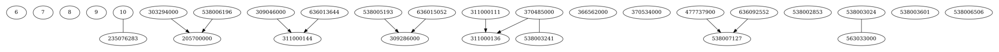

In [89]:
time_shift_la_data = time_shift_track(5, mmsi, 6, la_data)
time_shift_la_data = time_shift_track(10, mmsi, 7, time_shift_la_data)
time_shift_la_data = time_shift_track(30, mmsi, 8, time_shift_la_data)
time_shift_la_data = time_shift_track(60, mmsi, 9, time_shift_la_data)
time_shift_la_data = time_shift_track(120, mmsi, 10, time_shift_la_data)

clean_data = clean_data_processor(time_shift_la_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

  0%|          | 0/29 [00:00<?, ?it/s]

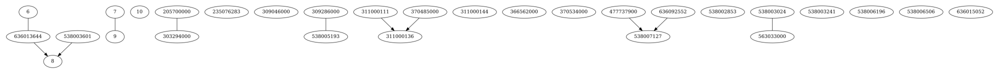

In [90]:
# Same thing but smaller time shifts
time_shift_la_data = time_shift_track(1, mmsi, 6, la_data)
time_shift_la_data = time_shift_track(2, mmsi, 7, time_shift_la_data)
time_shift_la_data = time_shift_track(3, mmsi, 8, time_shift_la_data)
time_shift_la_data = time_shift_track(5, mmsi, 9, time_shift_la_data)
time_shift_la_data = time_shift_track(10, mmsi, 10, time_shift_la_data)

clean_data = clean_data_processor(time_shift_la_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

**Sample 4**

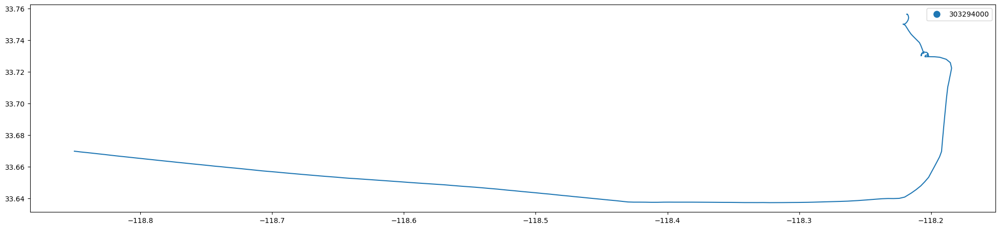

In [91]:
mmsi = 303294000
draw_tracks(la_data, [mmsi])

  0%|          | 0/29 [00:00<?, ?it/s]

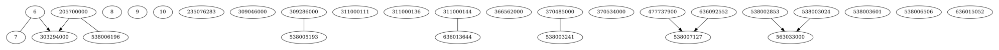

In [92]:
time_shift_la_data = time_shift_track(5, mmsi, 6, la_data)
time_shift_la_data = time_shift_track(10, mmsi, 7, time_shift_la_data)
time_shift_la_data = time_shift_track(30, mmsi, 8, time_shift_la_data)
time_shift_la_data = time_shift_track(60, mmsi, 9, time_shift_la_data)
time_shift_la_data = time_shift_track(120, mmsi, 10, time_shift_la_data)

clean_data = clean_data_processor(time_shift_la_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

  0%|          | 0/29 [00:00<?, ?it/s]

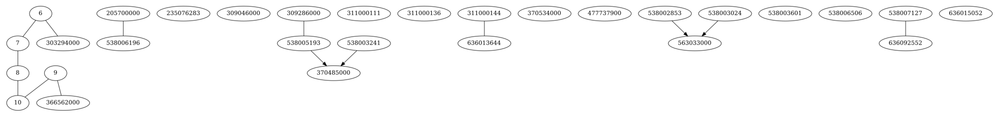

In [93]:
# Same thing but smaller time shifts
time_shift_la_data = time_shift_track(3, mmsi, 6, la_data)
time_shift_la_data = time_shift_track(5, mmsi, 7, time_shift_la_data)
time_shift_la_data = time_shift_track(7, mmsi, 8, time_shift_la_data)
time_shift_la_data = time_shift_track(9, mmsi, 9, time_shift_la_data)
time_shift_la_data = time_shift_track(10, mmsi, 10, time_shift_la_data)

clean_data = clean_data_processor(time_shift_la_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(morning_tracks)

In [94]:
tracks_data

MMSI,6,7,8,9,10,205700000,212348000,235060304,235076283,235554000,...,563025600,563033000,577364000,636010677,636013644,636015052,636015359,636017731,636018146,636092552
BaseDateTime,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,26.065217,...,0.000000,0.000000,0.0,0.000000,20.002174,8.404348,0.000000,0.0,0.0,0.000000
2020-01-01 00:10:00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,31.720930,...,0.000000,0.000000,0.0,0.000000,16.834884,13.937209,0.000000,0.0,0.0,14.906977
2020-01-01 00:20:00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,23.485714,...,0.000000,0.000000,0.0,0.000000,17.488571,19.257143,0.000000,0.0,0.0,4.028571
2020-01-01 00:30:00,0.0,0.0,0.0,0.0,0.0,3.665116,0.000000,0.000000,0.000000,31.627907,...,0.000000,0.000000,0.0,0.000000,21.930233,19.306977,0.000000,0.0,0.0,18.534884
2020-01-01 00:40:00,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,26.675676,...,0.000000,2.159459,0.0,0.000000,17.978378,9.151351,0.000000,0.0,0.0,17.891892
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-02 23:10:00,0.0,0.0,0.0,0.0,0.0,6.683607,3.737705,4.950820,1.021311,0.000000,...,0.000000,3.203279,0.0,1.727869,0.150820,12.277049,1.534426,0.0,0.0,2.049180
2020-01-02 23:20:00,0.0,0.0,0.0,0.0,0.0,7.044186,0.000000,8.116279,0.000000,0.000000,...,0.000000,7.725581,0.0,0.000000,0.000000,8.641860,2.220930,0.0,0.0,0.000000
2020-01-02 23:30:00,0.0,0.0,0.0,0.0,0.0,6.052000,1.580000,3.860000,0.000000,0.000000,...,0.000000,4.566000,0.0,0.000000,0.000000,16.806000,1.760000,0.0,0.0,0.000000


### Important Note  
It appears that the morning tracks do not actually appear as similar as we thought. Looking at the graphs below, most ships from the morning tracks are not moving very much. This definitely affects the anlaysis.

In [95]:
start_time, end_time

(Timestamp('2020-01-01 05:00:00'), Timestamp('2020-01-01 09:00:00'))

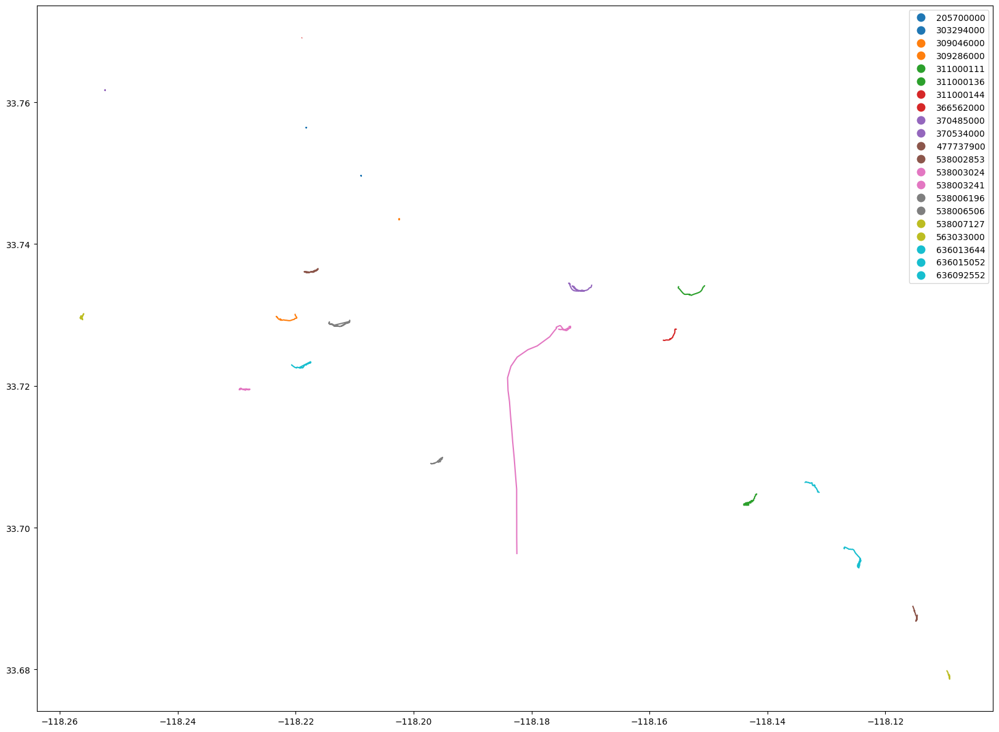

In [96]:
morning_la_data = la_data[(la_data.BaseDateTime > start_time) & (la_data.BaseDateTime < end_time)]
to_remove = [235076283, 538003601, 538005193]
morning_la_data = morning_la_data[morning_la_data.MMSI.isin(to_remove) == False]
draw_tracks(morning_la_data, np.unique(morning_la_data.MMSI))

## Time Shift Analysis Two Routes
### Comparison between two routes that look similar time shifted to within a small delta of each other  
We are interested in if we can identify connections in a graph when two tracks which appear very similar are time shifted to be within a small delta of eachother. We should see connections from this.

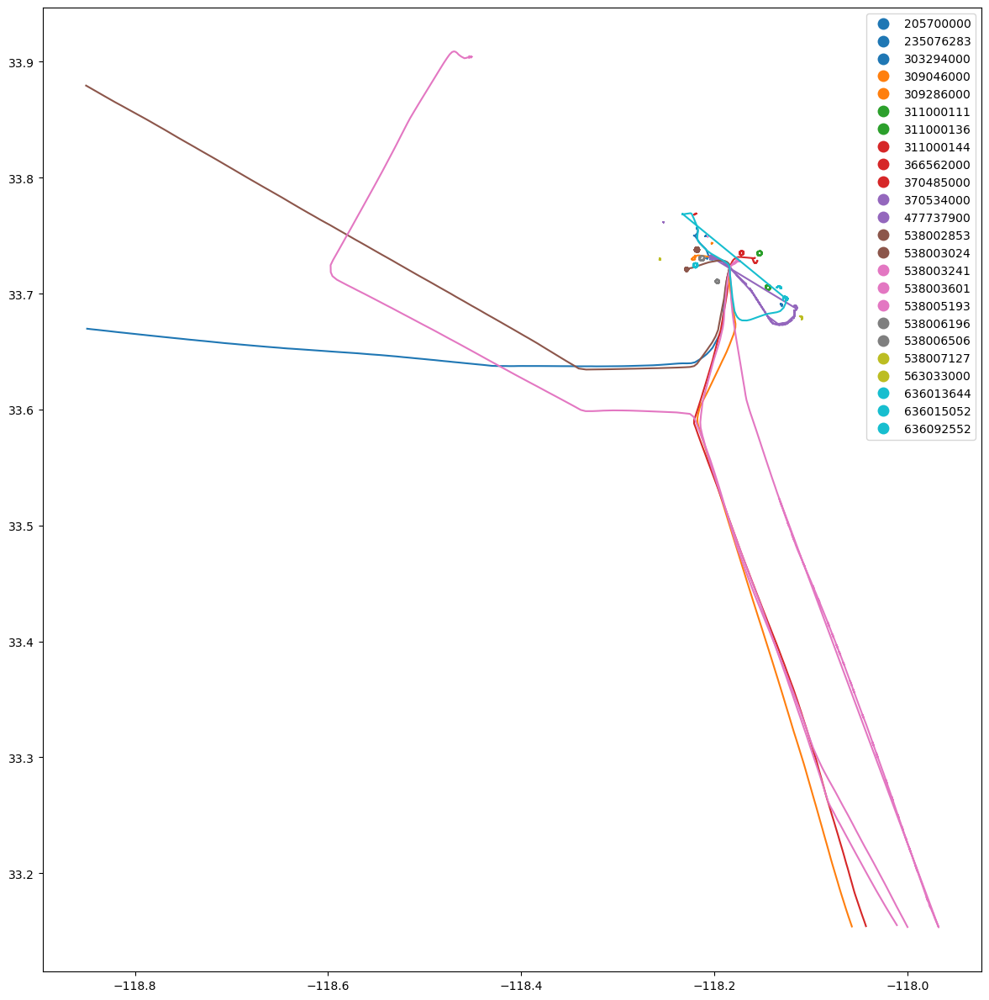

In [97]:
mmsi_list = list(morning_tracks_la.columns.values)
draw_tracks(la_data, mmsi_list)

In [98]:
similar = [309286000, 311000144]

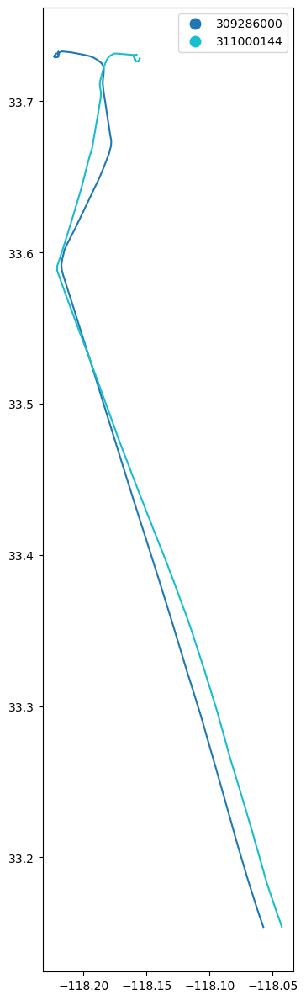

In [99]:
draw_tracks(la_data, similar)

In [100]:
mmsi_1 = similar[0]
mmsi_2 = similar[1]
data = la_data

In [101]:
ship_1 = data[data.MMSI == mmsi_1]
ship_2 = data[data.MMSI == mmsi_2]
ship_2 = ship_2.sample(ship_1.shape[0]).sort_index()
ship_2.BaseDateTime = ship_1.BaseDateTime.tolist()

In [102]:
data = pd.concat([data[data.MMSI != mmsi_2], ship_2])
data.sort_values(by="BaseDateTime", inplace=True)

Now that I have two tracks with very similar routes and the same exact timestamp, I will timeshift one of the two routes by some small delta and see the effects on the graph.

  0%|          | 0/62 [00:00<?, ?it/s]

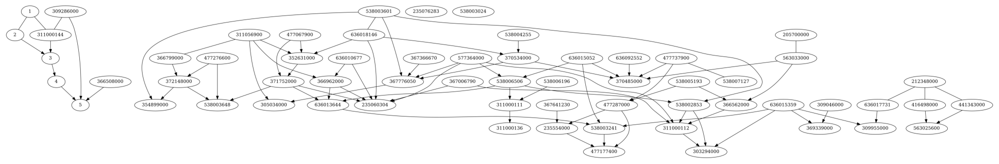

In [104]:
time_shift_data = time_shift_track(1, mmsi_2, 1, data)
time_shift_data = time_shift_track(2, mmsi_2, 2, time_shift_data)
time_shift_data = time_shift_track(5, mmsi_2, 3, time_shift_data)
time_shift_data = time_shift_track(10, mmsi_2, 4, time_shift_data)
time_shift_data = time_shift_track(15, mmsi_2, 5, time_shift_data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)

get_pc_graph(tracks_data)

In [130]:
start_time = data.BaseDateTime.min()
end_time = data.BaseDateTime.max()

  0%|          | 0/62 [00:00<?, ?it/s]

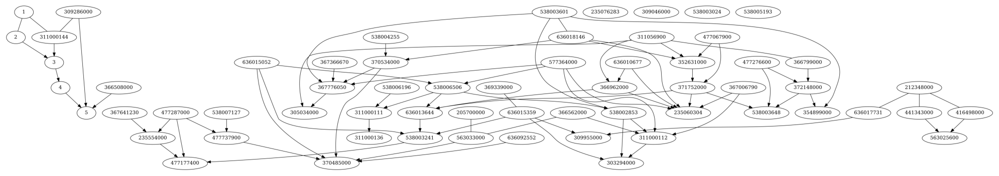

In [131]:
time_shift_data = time_shift_track(1, mmsi_2, 1, data)
time_shift_data = time_shift_track(2, mmsi_2, 2, time_shift_data)
time_shift_data = time_shift_track(5, mmsi_2, 3, time_shift_data)
time_shift_data = time_shift_track(10, mmsi_2, 4, time_shift_data)
time_shift_data = time_shift_track(15, mmsi_2, 5, time_shift_data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)
tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(tracks)

Now let us take the two similar tracks and see how close a third track must be timewise to be connected in the graph.

  0%|          | 0/58 [00:00<?, ?it/s]

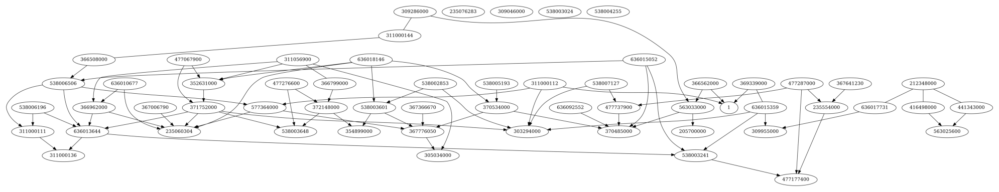

In [132]:
time_shift_data = time_shift_track(180, mmsi_2, 1, data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)
tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(tracks)

  0%|          | 0/58 [00:00<?, ?it/s]

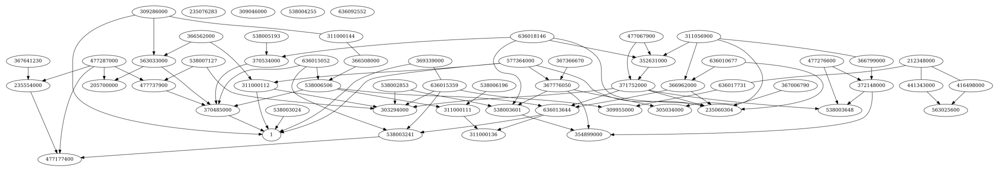

In [133]:
time_shift_data = time_shift_track(120, mmsi_2, 1, data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)
tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(tracks)

  0%|          | 0/58 [00:00<?, ?it/s]

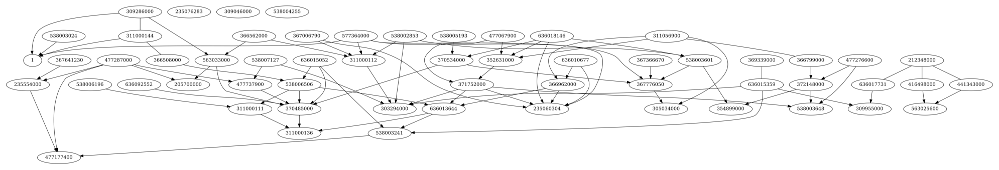

In [134]:
time_shift_data = time_shift_track(60, mmsi_2, 1, data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)
tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(tracks)

  0%|          | 0/58 [00:00<?, ?it/s]

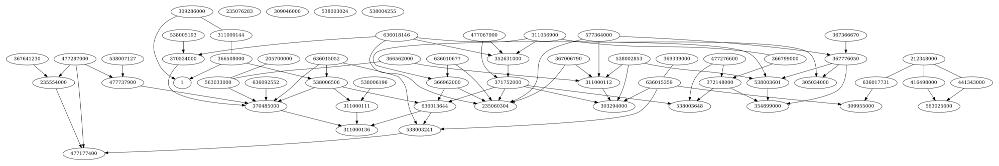

In [135]:
time_shift_data = time_shift_track(30, mmsi_2, 1, data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)
tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(tracks)

  0%|          | 0/58 [00:00<?, ?it/s]

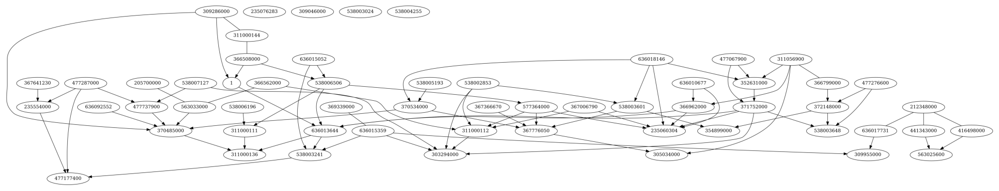

In [136]:
time_shift_data = time_shift_track(15, mmsi_2, 1, data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)
tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(tracks)

  0%|          | 0/58 [00:00<?, ?it/s]

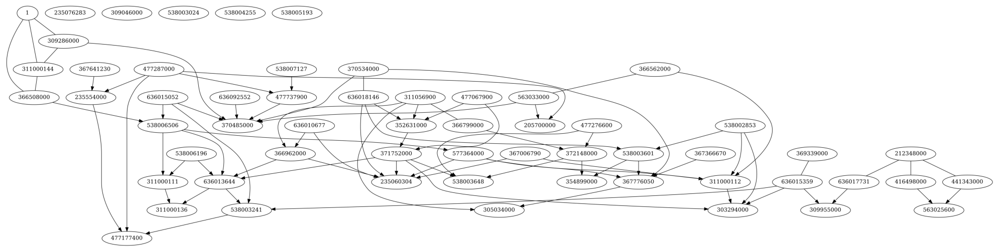

In [137]:
time_shift_data = time_shift_track(5, mmsi_2, 1, data)

clean_data = clean_data_processor(time_shift_data)
tracks_data = get_tracks(clean_data)
tracks = get_sub_tracks(tracks_data, start_time, end_time)

get_pc_graph(tracks)

Repeat the above analysis, but use two identical tracks that are separate from the graph

  0%|          | 0/34 [00:00<?, ?it/s]

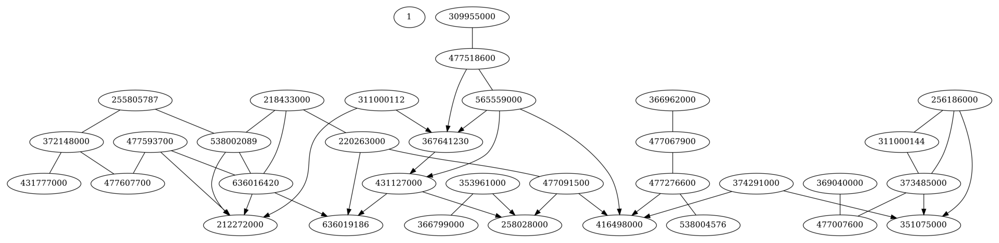

In [138]:
time_shift_ocean_data = time_shift_track(180, 311000112, 1, ocean_data)

clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)
get_pc_graph(morning_tracks)

  0%|          | 0/34 [00:00<?, ?it/s]

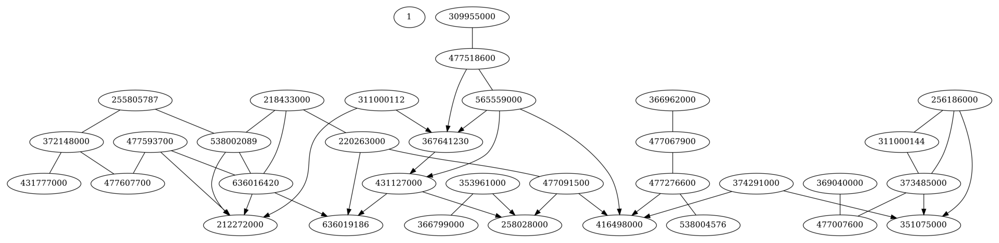

In [139]:
time_shift_ocean_data = time_shift_track(120, 311000112, 1, ocean_data)

clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)
get_pc_graph(morning_tracks)

  0%|          | 0/34 [00:00<?, ?it/s]

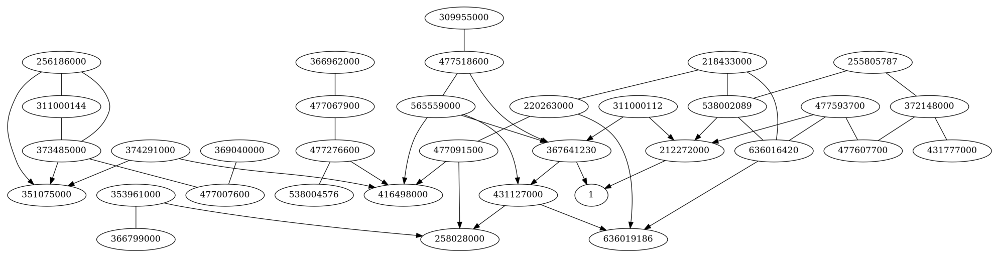

In [140]:
time_shift_ocean_data = time_shift_track(60, 311000112, 1, ocean_data)


clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)
get_pc_graph(morning_tracks)

  0%|          | 0/34 [00:00<?, ?it/s]

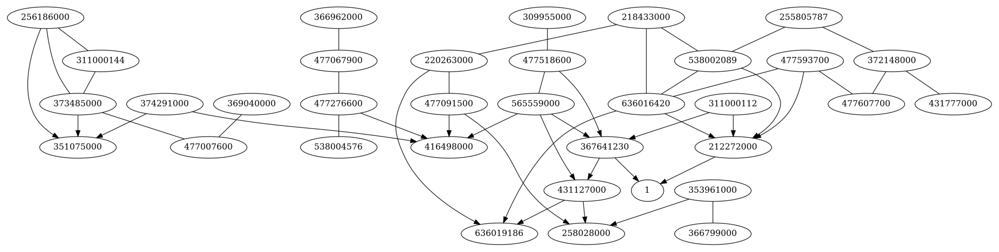

In [141]:
time_shift_ocean_data = time_shift_track(30, 311000112, 1, ocean_data)


clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)
get_pc_graph(morning_tracks)

  0%|          | 0/34 [00:00<?, ?it/s]

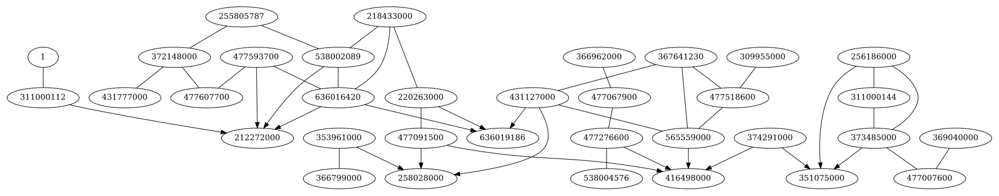

In [142]:
time_shift_ocean_data = time_shift_track(15, 311000112, 1, ocean_data)


clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)
get_pc_graph(morning_tracks)

  0%|          | 0/34 [00:00<?, ?it/s]

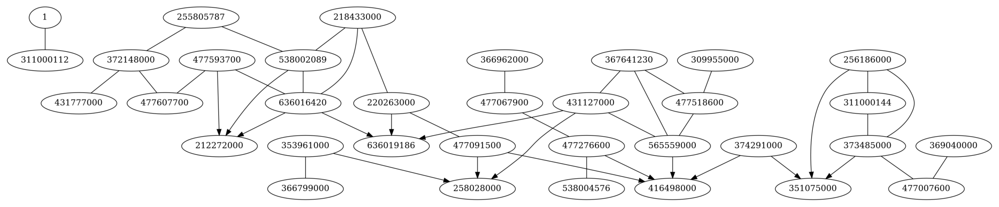

In [143]:
time_shift_ocean_data = time_shift_track(5, 311000112, 1, ocean_data)


clean_data = clean_data_processor(time_shift_ocean_data)
tracks_data = get_tracks(clean_data)
morning_tracks = get_sub_tracks(tracks_data, start_time, end_time)
get_pc_graph(morning_tracks)

# TODO 
1. This notebook is a mess. I need to reorganize everything into smaller and easier to understand notebooks in order to avoid more mistakes.
2. When reorganizing, I need to show visualizations of tracks only within the timespan of the track itself. I need to stop visualizing the tracks from the entire day. Simply, visualize the tracks that the graph is computed on.
3. What would the graph structure look like when time shifting two tracks from further apart? So instead of having 1, 2, 5, etc. time shifts, just do one at a time and see at which point do the tracks disconnect.
4. Consider removing ships that are not actually moving. There appears to be some ships that might be anchored and just floating. 